# SD

In [ ]:
from clip_slider_pipeline import CLIPSlider
from diffusers import StableDiffusionPipeline
import torch
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5").to(torch.float16)
slider = CLIPSlider(sd_pipe=pipe, 
                    device=torch.device("cuda:0" if torch.cuda.is_available()),
                    target_word="happy",
                    opposite="sad")

In [ ]:
scale = 2
slider.spectrum(prompt="a magnificanet botanic garden, cinematic, 8k",low_scale=-scale, high_scale=scale, steps=5, seed=0)

# SDXL

In [ ]:
from clip_slider_pipeline import CLIPSliderXL
from diffusers import StableDiffusionXLPipeline, AutoencoderKL
import torch
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, vae=vae,
)
slider_xl = CLIPSliderXL(sd_pipe=pipe, 
                    device=torch.device("cuda:0" if torch.cuda.is_available()),
                    target_word="happy",
                    opposite="sad")

In [ ]:
scale = 2
slider_xl.spectrum(prompt="a magnificanet botanic garden, cinematic, 8k",low_scale=-scale, high_scale=scale, steps=5, seed=0)

# SDXL Flash

### generate images using 6-10 steps

In [1]:
import torch
from clip_slider_pipeline import CLIPSliderXL
from diffusers import StableDiffusionXLPipeline, EulerDiscreteScheduler
from diffusers.utils import make_image_grid

pipe = StableDiffusionXLPipeline.from_pretrained("sd-community/sdxl-flash").to("cuda", torch.float16)
pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config)

flash_slider = CLIPSliderXL(sd_pipe=pipe, 
                    device=torch.device("cuda"),
                    target_word="happy",
                    opposite="sad")

2024-07-18 12:49:22.463317: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-18 12:49:22.499160: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-18 12:49:23.355101: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 300/300 [00:15<00:00, 18.90it/s]


  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

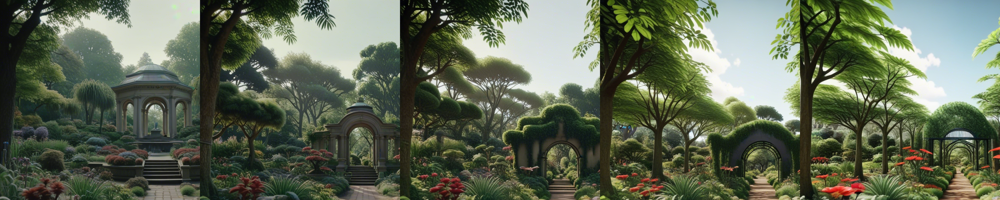

In [3]:
scale = 2
flash_slider.spectrum(prompt="a magnificanet botanic garden, cinematic, 8k",low_scale=-scale, high_scale=scale, steps=5, seed=0, num_inference_steps=8)

# (more) Controlled Generation

## SDXL & IP Adapter

### generate image variations / condition on a style while traversing from one concept to another

In [10]:
import torch
from clip_slider_pipeline import CLIPSliderXL
from diffusers import StableDiffusionXLPipeline, EulerDiscreteScheduler
from diffusers.utils import make_image_grid, load_image

pipe = StableDiffusionXLPipeline.from_pretrained("sd-community/sdxl-flash").to("cuda", torch.float16)
pipe.scheduler = EulerDiscreteScheduler.from_config(pipe.scheduler.config)

# load IP Adapter
pipe.load_ip_adapter("h94/IP-Adapter", subfolder="sdxl_models", weight_name="ip-adapter_sdxl.bin")
scale = 0.8
pipe.set_ip_adapter_scale(scale)

flash_slider = CLIPSliderXL(sd_pipe=pipe, 
                    device=torch.device("cuda"),
                    target_word="barbie",
                    opposite="darth vader")



Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 300/300 [00:15<00:00, 19.78it/s]


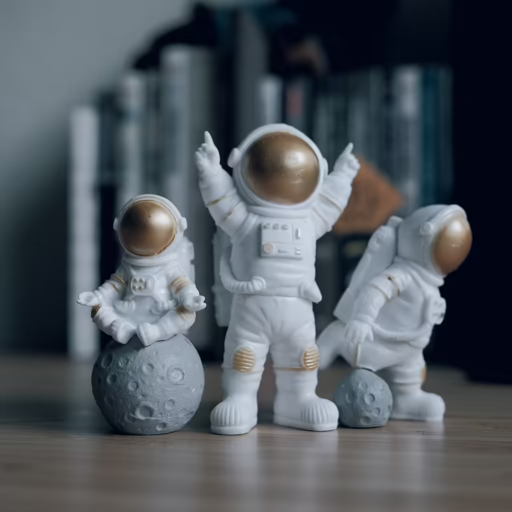

In [13]:
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-sdxl-init.png"
image = load_image(url)
image.resize((512,512))

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

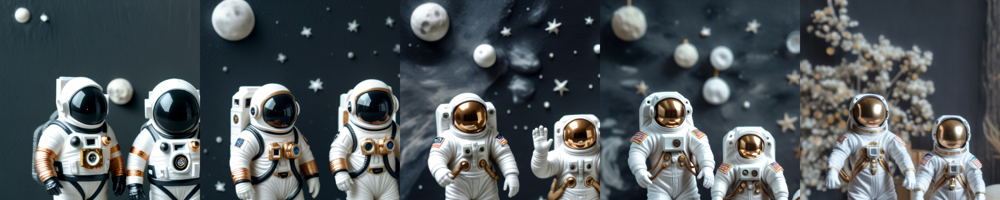

In [14]:
scale = 2.5
flash_slider.spectrum(prompt="3 astronauts",low_scale=-scale, high_scale=scale, steps=5,
                             ip_adapter_image=image, 
                             num_inference_steps=10,
                             seed=0)

## SDXL ControlNet

In [26]:
import torch
import random
from tqdm import tqdm
from controlnet_aux import PidiNetDetector, HEDdetector
from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline, AutoencoderKL
from diffusers.utils import make_image_grid, load_image
import numpy as np
import cv2
from PIL import Image

controlnet = ControlNetModel.from_pretrained(
    "xinsir/controlnet-canny-sdxl-1.0", # insert here your choice of controlnet
    torch_dtype=torch.float16
)
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "sd-community/sdxl-flash",
    controlnet=controlnet,
    vae=vae,
    torch_dtype=torch.float16,
)

flash_slider = CLIPSliderXL(sd_pipe=pipe, 
                    device=torch.device("cuda"),
                    target_word="happy",
                    opposite="sad")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 300/300 [00:15<00:00, 19.31it/s]


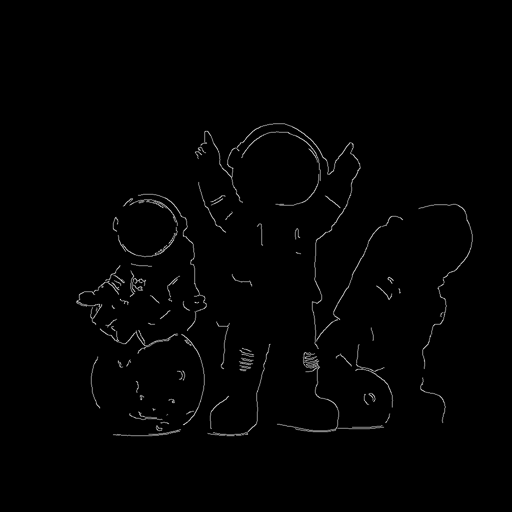

In [36]:
import cv2
def HWC3(x):
    assert x.dtype == np.uint8
    if x.ndim == 2:
        x = x[:, :, None]
    assert x.ndim == 3
    H, W, C = x.shape
    assert C == 1 or C == 3 or C == 4
    if C == 3:
        return x
    if C == 1:
        return np.concatenate([x, x, x], axis=2)
    if C == 4:
        color = x[:, :, 0:3].astype(np.float32)
        alpha = x[:, :, 3:4].astype(np.float32) / 255.0
        y = color * alpha + 255.0 * (1.0 - alpha)
        y = y.clip(0, 255).astype(np.uint8)
        return y
    
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-sdxl-init.png"
image = load_image(url)
image.resize((512,512))
controlnet_img = np.array(image)
controlnet_img = cv2.Canny(controlnet_img, 100, 200)
controlnet_img = HWC3(controlnet_img)
controlnet_img = Image.fromarray(controlnet_img)
controlnet_img.resize((512,512))

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

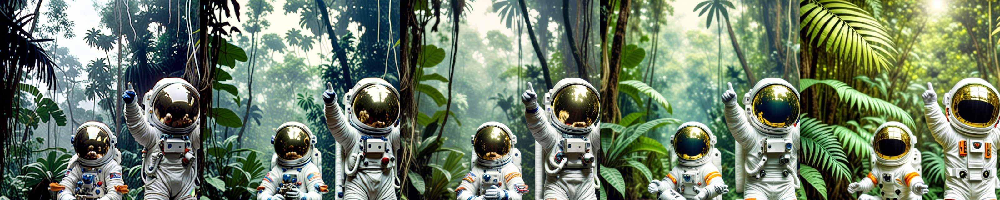

In [37]:
scale = 2.5
flash_slider.spectrum(prompt="astronauts in the jungle",
                      low_scale=-scale, high_scale=scale, steps=5,
                             image=controlnet_img, 
                             controlnet_conditioning_scale = 0.7,
                             num_inference_steps=10,
                             seed=0)